## Difficult estimation

In [1]:
import numpy as np
import random
from pysat.solvers import Solver
from collections import deque
from scipy.ndimage import label, find_objects
from scipy.spatial import distance
import matplotlib.pyplot as plt
import itertools 
import z3
import json

In [ ]:
# Load the dataset
data = np.load("star_battle_dataset.npz", allow_pickle=True)
puzzles = data["puzzles"]
solutions = data["solutions"]

# Pick 5 random puzzles
some_puzzles = random.sample(range(len(puzzles)), 5)

# Show
for i in some_puzzles:
    print(f"Showing puzzle {i+1}/{len(puzzles)}")
    print(puzzles[i])

Showing puzzle 2255/2500
[[5 5 5 5 5 5 8 8 8 8]
 [6 6 6 5 5 5 5 8 0 1]
 [6 6 6 6 5 5 4 4 0 1]
 [6 6 6 6 5 4 4 4 0 1]
 [2 2 6 6 5 5 3 4 0 1]
 [2 2 9 9 5 3 3 3 0 0]
 [2 2 9 9 9 3 3 3 0 0]
 [2 2 7 9 9 3 3 3 0 0]
 [2 2 7 7 7 3 3 0 0 0]
 [2 2 7 7 7 7 3 0 0 0]]
Showing puzzle 520/2500
[[4 0 0 0 1 1 1 1 1 1]
 [4 0 0 0 1 1 1 1 1 8]
 [4 0 0 0 0 1 1 1 8 8]
 [4 4 4 0 3 3 3 1 8 8]
 [4 4 4 9 9 9 9 7 8 8]
 [4 4 4 9 9 9 9 7 7 8]
 [2 2 4 6 9 9 7 7 7 8]
 [2 2 6 6 5 5 5 7 7 7]
 [2 2 6 6 6 6 5 7 7 7]
 [2 2 2 6 6 6 7 7 7 7]]
Showing puzzle 402/2500
[[8 8 8 8 8 3 3 3 3 3]
 [8 8 8 8 2 2 2 2 2 2]
 [8 8 8 8 5 5 2 2 2 2]
 [4 4 4 8 5 5 5 2 2 2]
 [4 4 4 6 5 5 5 5 7 7]
 [4 4 4 6 6 6 5 7 7 7]
 [4 4 4 6 1 1 7 7 7 0]
 [4 4 4 4 1 1 1 7 0 0]
 [4 4 4 1 1 1 1 0 0 0]
 [9 9 9 9 1 1 1 1 0 0]]
Showing puzzle 253/2500
[[8 8 8 3 3 3 3 3 3 2]
 [8 8 8 9 3 3 3 2 2 2]
 [8 9 9 9 9 5 5 2 2 2]
 [8 8 6 6 6 5 5 5 2 2]
 [6 6 6 6 4 5 5 5 5 5]
 [6 6 6 4 4 4 5 5 5 5]
 [1 1 4 4 4 4 0 0 0 5]
 [1 1 1 4 4 4 0 0 0 0]
 [1 1 4 4 4 4 7 0 0 0]
 [1

## solving heuristics

In [6]:
#hand written heuristic solving
def zero_surrounding_cells(answer):
    # Get the dimensions of the answer grid
    rows, cols = answer.shape
    
    
    for row in range(rows):
        for col in range(cols):
            # If there's a star at this position
            if answer[row, col] == 1:
                # Set the surrounding cells to 0
                for d_row in [-1, 0, 1]:
                    for d_col in [-1, 0, 1]:
                        # Skip the star itself
                        if d_row == 0 and d_col == 0:
                            continue
                        
                        # Find neighbours
                        new_row, new_col = row + d_row, col + d_col
                        
                        # Check if the neighbor is within bounds
                        if 0 <= new_row < rows and 0 <= new_col < cols:
                            answer[new_row, new_col] = 0

    return answer

# function to update the puzzle with the stars with no cell hidden
def mark_no_star_cells(puzzle, answer):
    # Find all cells that are definitely no stars
    no_star_cells = np.argwhere(answer == 0)

    # Update puzzle by setting no-star cells to -1
    for row, col in no_star_cells:
        puzzle[row, col] = -1

    return puzzle

# specific heuristics functions 

# normal heuristics functions

def two_cell_area(puzzle, answer):
    made_progress = False
    puzzle = mark_no_star_cells(puzzle, answer)

    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        # Find stars and empty cells
        star_cells = [(r, c) for r, c in region_cells if answer[r, c] == 1]
        empty_cells = [(r, c) for r, c in region_cells if answer[r, c] is None]

        # If exactly 2 empty cells, place both stars
        if len(empty_cells) == 2 and len(star_cells) == 0:
            for r, c in empty_cells:
                answer[r, c] = 1
            print("2 cells starred")
            made_progress = True

        # If exactly 1 empty cell and 1 star, place the last star
        elif len(empty_cells) == 1 and len(star_cells) == 1:
            r, c = empty_cells[0]
            answer[r, c] = 1
            print("one cell starred")
            made_progress = True

    return made_progress, answer

def apply_straight_lines(puzzle, answer):
    puzzle = mark_no_star_cells(puzzle, answer)

    made_progress = False
    rows, cols = puzzle.shape

    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        if len(region_cells) <2:
            continue 

        #get row and column values
        row_coords = region_cells[:, 0]
        col_coords = region_cells[:, 1]

        is_row = np.all(row_coords == row_coords[0])  
        is_col = np.all(col_coords == col_coords[0])  

        if is_row:
            row = row_coords[0]
            sorted_cols = np.sort(col_coords)

            # mark cells outside the region 0
            for c in range(cols):
                if puzzle[row, c] != region:
                    answer[row, c] = 0
                    made_progress = True

            # for3-cell straight line, place stars at both ends
            if len(region_cells) == 3:
                answer[row, sorted_cols[0]] = 1
                answer[row, sorted_cols[2]] = 1
                answer[row, sorted_cols[1]] = 0  
                made_progress = True

        elif is_col:
            col = col_coords[0]
            sorted_rows = np.sort(row_coords)

            # Mark all non-region cells in this column as definite zeros
            for r in range(rows):
                if puzzle[r, col] != region:
                    answer[r, col] = 0
                    made_progress = True

            # 3 cell stars and 0
            if len(region_cells) == 3:
                answer[sorted_rows[0], col] = 1
                answer[sorted_rows[2], col] = 1
                answer[sorted_rows[1], col] = 0  #
                made_progress = True

    if made_progress:
        print("Straight lines applied")

    zero_surrounding_cells(answer)
    return made_progress, answer
    
def apply_t_shapes(puzzle, answer):
    puzzle = mark_no_star_cells(puzzle, answer)

    made_progress = False
    rows, cols = puzzle.shape

    # Iterate over each unique region
    for region in np.unique(puzzle):
        # Get all cells belonging to this region
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        # check exactly 4 cells
        if len(region_cells) != 4:
            continue  

        # Convert to a set for lookup
        region_set = {tuple(cell) for cell in region_cells}

        # Check all possible T-shape formations
        for r, c in region_cells:
            # Horizontal (Three in a row, one below)
            if {(r, c - 1), (r, c), (r, c + 1), (r + 1, c)}.issubset(region_set):
                answer[r, c - 1] = 1
                answer[r, c + 1] = 1
                answer[r, c] = 0
                answer[r + 1, c] = 0
                made_progress = True

            # Horizontal (Three in a row, one above)
            if {(r - 1, c), (r, c - 1), (r, c), (r, c + 1)}.issubset(region_set):
                answer[r, c - 1] = 1
                answer[r, c + 1] = 1
                answer[r, c] = 0
                answer[r - 1, c] = 0
                made_progress = True

            # Vertical (Three in a column, one to the right)
            if {(r - 1, c), (r, c), (r + 1, c), (r, c + 1)}.issubset(region_set):
                answer[r - 1, c] = 1
                answer[r + 1, c] = 1
                answer[r, c] = 0
                answer[r, c + 1] = 0
                made_progress = True

            # Vertical (Three in a column, one to the left)
            if {(r - 1, c), (r, c), (r + 1, c), (r, c - 1)}.issubset(region_set):
                answer[r - 1, c] = 1
                answer[r + 1, c] = 1
                answer[r, c] = 0
                answer[r, c - 1] = 0
                made_progress = True
    if made_progress:
        print("tshapes found")
    zero_surrounding_cells(answer)
    return made_progress, answer

def apply_l_shapes(puzzle, answer):
    puzzle = mark_no_star_cells(puzzle, answer)

    made_progress = False

    rows, cols = puzzle.shape

    # Iterate over each unique region
    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        # exactly 4 cells
        if len(region_cells) != 4:
            continue  

        # Convert to a set for lookup
        region_set = {tuple(cell) for cell in region_cells}

        for r, c in region_cells:

            # Vertical line + right extension
            if {(r - 1, c), (r, c), (r + 1, c), (r + 1, c + 1)}.issubset(region_set):
                answer[r - 1, c] = 1
                answer[r, c] = 0
                if r + 2 < rows:
                    answer[r + 2, c] = 0
                    answer[r + 2, c + 1] = 0
                made_progress = True
                made_progress = True

            # Vertical line + left extension
            if {(r - 1, c), (r, c), (r + 1, c), (r + 1, c - 1)}.issubset(region_set):
                answer[r - 1, c] = 1
                answer[r, c] = 0
                if r + 2 < rows:
                    answer[r + 2, c] = 0
                    answer[r + 2, c - 1] = 0
                made_progress = True

            # Vertical line + top right extension
            if {(r - 1, c), (r, c), (r + 1, c), (r - 1, c + 1)}.issubset(region_set):
                answer[r + 1, c] = 1
                answer[r, c] = 0
                if r + 2 < rows:
                    answer[r - 2, c] = 0
                    answer[r - 2, c + 1] = 0
                made_progress = True
                made_progress = True

            # Vertical line + left top extension
            if {(r - 1, c), (r, c), (r + 1, c), (r - 1, c - 1)}.issubset(region_set):
                answer[r + 1, c] = 1
                answer[r, c] = 0
                if r + 2 < rows:
                    answer[r - 2, c] = 0
                    answer[r - 2, c - 1] = 0
                made_progress = True

            # Horizontal line + bottom left extension
            if {(r, c - 1), (r, c), (r, c + 1), (r + 1, c - 1)}.issubset(region_set):
                answer[r, c + 1] = 1
                answer[r, c] = 0
                if r + 1 < rows and c - 2 >= 0:
                    answer[r, c - 2] = 0
                    answer[r + 1, c - 2] = 0
                made_progress = True
            
            # Horizontal line + top left extension
            if {(r, c - 1), (r, c), (r, c + 1), (r - 1, c - 1)}.issubset(region_set):
                answer[r, c + 1] = 1
                answer[r, c] = 0
                if r + 1 < rows and c - 2 >= 0:
                    answer[r, c - 2] = 0
                    answer[r - 1, c - 2] = 0
                made_progress = True

            # Horizontal line + bottom right extension
            if {(r, c - 1), (r, c), (r, c + 1), (r + 1, c + 1)}.issubset(region_set):
                answer[r, c - 1] = 1
                answer[r, c] = 0
                if r + 1 < rows and c + 2 < cols:
                    answer[r, c + 2] = 0
                    answer[r + 1, c + 2] = 0
                made_progress = True

            # Horizontal line + top right extension
            if {(r, c - 1), (r, c), (r, c + 1), (r - 1, c + 1)}.issubset(region_set):
                answer[r, c - 1] = 1
                answer[r, c] = 0
                if r + 1 < rows and c + 2 < cols:
                    answer[r, c + 2] = 0
                    answer[r - 1, c + 2] = 0
                made_progress = True

    if made_progress:
        print("Lshapes found")
    zero_surrounding_cells(answer)
    return made_progress, answer

def apply_pbdq_shapes(puzzle, answer):
    puzzle = mark_no_star_cells(puzzle, answer)
    made_progress = False
    rows, cols = puzzle.shape

    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        if len(region_cells) != 5:
            continue

        region_set = {tuple(cell) for cell in region_cells}

        # Try every 2×2 square in the region
        for r, c in region_set:
            if {(r, c), (r + 1, c), (r, c + 1), (r + 1, c + 1)}.issubset(region_set):
                # top left extra square
                if {(r - 1, c)}.issubset(region_set):
                    answer[r-1,c] = 1
                    answer[r,c]= 0
                    answer[r, c+1]= 0
                    made_progress = True
                    if r + 2 < rows:
                        answer[r+2,c]= 0
                        answer[r+2, c+1]= 0
                
                # top right
                if {(r-1,c+1)}.issubset(region_set):
                    answer[r-1,c+1] = 1
                    answer[r,c]= 0
                    answer[r, c+1]= 0
                    made_progress = True
                    if r + 2 < rows:
                        answer[r+2,c]= 0
                        answer[r+2, c+1]= 0
                    
                # bot left
                if {(r +2, c)}.issubset(region_set):
                    answer[r+2,c]= 1
                    answer[r+1, c]= 0
                    answer[r+1, c+1]= 0
                    made_progress = True
                    if r - 1 >= 0 :
                        answer[r-1,c]= 0
                        answer[r-1, c+1]= 0 


                # bot right
                if {(r + 2, c + 1)}.issubset(region_set):
                    answer[r+2,c+1]= 1
                    answer[r+1, c]= 0
                    answer[r+1, c+1]= 0
                    made_progress = True
                    if r - 1 >= 0 :
                        answer[r-1,c]= 0
                        answer[r-1, c+1]= 0 
                    

                # left top
                if {(r, c - 1)}.issubset(region_set):
                    answer[r, c-1]= 1
                    answer[r,c]= 0
                    answer[r+1, c]= 0
                    made_progress= True
                    if c+2 < cols:
                        answer[r, c+2]= 0
                        answer[r+1, c+2]= 0


                # left bottom
                if {(r + 1, c - 1)}.issubset(region_set):
                    answer[r+1 , c-1]= 1
                    answer[r,c]= 0
                    answer[r+1, c]= 0
                    made_progress= True
                    if c+2 < cols:
                        answer[r, c+2]= 0
                        answer[r+1, c+2]= 0

                # right top
                if {(r, c + 2)}.issubset(region_set):
                    answer[r,c+2]= 1
                    answer[r, c+1]= 0
                    answer[r+1, c+1]= 0
                    made_progress = True
                    if c-1 >=0:
                        answer[r, c-1]= 0
                        answer[r+1, c-1]= 0 

                # right bottom
                if {(r + 1, c + 2)}.issubset(region_set):
                    answer[r+1,c+2]= 1
                    answer[r, c+1]= 0
                    answer[r+1, c+1]= 0
                    made_progress = True
                    if c-1 >=0:
                        answer[r, c-1]= 0
                        answer[r+1, c-1]= 0

    if made_progress:
        print("pbqdshapes found") 
    zero_surrounding_cells(answer)
    return made_progress, answer

def apply_offset_stack(puzzle, answer):
    puzzle = mark_no_star_cells(puzzle, answer)
    made_progress = False
    
    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        

        # exactly 4 cells
        if len(region_cells) != 4:
            continue

        region_set = {tuple(cell) for cell in region_cells}

        for r, c in region_cells:
            # Check for a horizontal Z
            if {(r, c), (r, c + 1), (r + 1, c - 1), (r + 1, c)}.issubset(region_set):
                answer[r, c+1] = 1
                answer[r + 1, c - 1] = 1
                made_progress = True

            # Check for an horizontal S
            if {(r, c), (r, c + 1), (r + 1, c + 1), (r + 1, c + 2)}.issubset(region_set):
                answer[r, c] = 1
                answer[r + 1, c + 2] = 1
                made_progress = True

            # Check for a vertical Z
            if {(r, c), (r + 1, c), (r + 1, c + 1), (r + 2, c + 1)}.issubset(region_set):
                answer[r, c] = 1
                answer[r + 2, c + 1] = 1
                made_progress = True

            # Check for a vertical S
            if {(r, c), (r + 1, c), (r + 1, c - 1), (r + 2, c - 1)}.issubset(region_set):
                answer[r, c] = 1
                answer[r + 2, c - 1] = 1
                made_progress = True


    if made_progress:
        print("offest stack found")
    zero_surrounding_cells(answer)
    return made_progress, answer

def apply_6_cell_rectangle(puzzle, answer):
    made_progress = False
    puzzle = mark_no_star_cells(puzzle, answer)
    rows, cols = puzzle.shape

    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        if len(region_cells) != 6:
            continue

        region_set = {tuple(cell) for cell in region_cells}

        # Check for 6 shape
        for r, c in region_cells:
            # Horizontal 
            if {(r, c - 1), (r, c), (r, c + 1), (r + 1, c-1),(r+1, c), (r+1,c+1)}.issubset(region_set):
                answer[r,c] = 0
                answer[r+1,c] = 0
                if c-2 >= 0:
                    answer[r,c-2]= 0
                    answer[r+1,c-2]=0
                if c+2 < cols:
                    answer[r, c+2]= 0
                    answer[r+1,c+2]= 0
                made_progress = True
            # Vertical 
            if {(r -1, c), (r, c), (r+1, c), (r - 1, c+1),(r, c+1), (r+1,c+1)}.issubset(region_set):
                answer[r,c] = 0
                answer[r,c+1] = 0
                if r-2>= 0:
                    answer[r-2,c]= 0
                    answer[r-2,c+1]=0
                if r+2 < rows:
                    answer[r+2, c]= 0
                    answer[r+2,c+1]= 0
                made_progress = True

    if made_progress:
        print("6 cell found")

    return made_progress, answer

def apply_9_cell_square(puzzle, answer):
    made_progress = False
    puzzle = mark_no_star_cells(puzzle, answer)
    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])

        if len(region_cells) != 9:
            continue

        region_set = {tuple(cell) for cell in region_cells}

        # Check for square
        for r, c in region_cells:
            if {(r-1,c-1),(r-1,c),(r-1,c+1),(r,c-1),(r,c), (r,c+1),(r+1,c-1),(r+1,c),(r+1,c-1)}.issubset(region_set):
                answer[r,c] = 0
                made_progress = True
                

    if made_progress:
        print("9 cell found")
    
    return made_progress, answer

def apply_star_surrounds(puzzle, answer):
    made_progress = False
    rows, cols = puzzle.shape

    # Check rows
    for r in range(rows):
        if np.sum(np.array(answer[r]) == 1) == 2:  #row has enough stars
            for c in range(cols):
                if answer[r, c] is None:  #remaining cells zeroed
                    answer[r, c] = 0
                    made_progress = True

    # Check columns
    for c in range(cols):
        if np.sum(np.array(answer[:, c]) == 1) == 2:  # enough stars
            for r in range(rows):
                if answer[r, c] is None:  # remaining cells 0
                    answer[r, c] = 0
                    made_progress = True
    
    if made_progress:
        print("star surrounds zeroed")

    return made_progress, answer

def row_col_reduction_rule(puzzle, answer):
    made_progress = False
    rows, cols = puzzle.shape

    puzzle = mark_no_star_cells(puzzle, answer)

    row_region_map = {}  
    col_region_map = {} 

    # Group regions by shared rows/columns
    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        unique_rows = sorted(set(r for r, _ in region_cells))
        unique_cols = sorted(set(c for _, c in region_cells))

        if len(unique_rows) == 2:
            row_pair = tuple(unique_rows)
            row_region_map.setdefault(row_pair, []).append(region)

        if len(unique_cols) == 2:
            col_pair = tuple(unique_cols)
            col_region_map.setdefault(col_pair, []).append(region)

    # row elimination rule
    for (row1, row2), region_ids in row_region_map.items():
        if len(region_ids) == 2:  
            allowed_cells = set()
            for region in region_ids:
                allowed_cells.update(map(tuple, np.argwhere(puzzle == region)))

            for col in range(cols):
                if (row1, col) not in allowed_cells and answer[row1, col] is None:
                    answer[row1, col] = 0
                    made_progress = True
                if (row2, col) not in allowed_cells and answer[row2, col] is None:
                    answer[row2, col] = 0
                    made_progress = True

    # eliminations for columns
    for (col1, col2), region_ids in col_region_map.items():
        if len(region_ids) == 2:  
            allowed_cells = set()
            for region in region_ids:
                allowed_cells.update(map(tuple, np.argwhere(puzzle == region)))

            for row in range(rows):
                if (row, col1) not in allowed_cells and answer[row, col1] is None:
                    answer[row, col1] = 0
                    made_progress = True
                if (row, col2) not in allowed_cells and answer[row, col2] is None:
                    answer[row, col2] = 0
                    made_progress = True

    return made_progress, answer



# hard heuristic functions
def find_valid_clumps(region_cells):
#tries to split region into clumps
    valid_clumps = []

    for i in range(len(region_cells)):
        for j in range(i+1, len(region_cells)):
            clump1 = [region_cells[i], region_cells[j]]
            
            # Check if these cells fit in a 2x2 block
            if can_fit_2x2(clump1):
                remaining_cells = [cell for k, cell in enumerate(region_cells) if k != i and k != j]
                for k in range(len(remaining_cells)):
                    for l in range(k+1, len(remaining_cells)):
                        clump2 = [remaining_cells[k], remaining_cells[l]]
                        if can_fit_2x2(clump2):
                            valid_clumps.append([clump1, clump2]) 

    return valid_clumps

def can_fit_2x2(clump):
#checks if clump found fits the 2x2
    if len(clump) == 2:
        rows, cols = zip(*clump)
        min_row, max_row = min(rows), max(rows)
        min_col, max_col = min(cols), max(cols)

        # row and column spans are <= 2, it fits in a 2x2 area
        return max_row - min_row <= 1 and max_col - min_col <= 1

    return False

def apply_rule_of_clumps(puzzle, answer):
    made_progress = False
    rows, cols = puzzle.shape

    puzzle = mark_no_star_cells(puzzle, answer)  

    for region in np.unique(puzzle):
        region_cells = np.argwhere(puzzle == region)
        region_cells = np.array([cell for cell in region_cells if puzzle[cell[0], cell[1]] != -1])
        
        if len(region_cells) < 4 or len(region_cells) > 6:
            continue  

        possible_clumps = find_valid_clumps(region_cells)

        if len(possible_clumps) == 0:
            continue
        

        # Apply deduction to each clump
        for clump_pair in possible_clumps:
            clump_set = set(tuple(cell) for clump in clump_pair for cell in clump)

            if len(clump_pair) == 2:  # for 2-cell clump
                # Check if clump is horizontal or vertical
                (r1, c1), (r2, c2) = clump_pair[0]

                if r1 == r2:  
                    if (r1-1) >=0:
                        answer[r1-1,c1]=0
                        answer[r2-1,c2]=0
                    if (r1+1) <rows:
                        answer[r1+1,c1]=0
                        answer[r2+1,c2]=0
                    made_progress = True
                    

                elif c1 == c2: 
                    if (c1-1)>=0 :
                        answer[r1,c1-1]=0
                        answer[r2, c2-1]=0
                    if (c1+1)<cols:
                        answer[r1, c1+1]=0
                        answer[r2, c2+1]=0
                    made_progress = True
                    

            if len(clump_pair) == 3:  # For 3-cell clump
                (r1, c1), (r2, c2), (r3, c3) = clump_pair[0]

                # 2x2 region box
                minr, maxr = min(r1, r2, r3), max(r1, r2, r3)
                minc, maxc = min(c1, c2, c3), max(c1, c2, c3)

                #2x2 block
                surrounding_cells = [(minr, minc), (minr, maxc), (maxr, minc), (maxr, maxc)]

                for r, c in surrounding_cells:
                    # If the cell is not part of the clump, deduct it
                    if (r, c) not in clump_set and 0 <= r < rows and 0 <= c < cols:
                        answer[r, c] = 0
                        made_progress = True
                            


    return made_progress, answer



def apply_rule_of_nosy_neighbors(puzzle, answer):
    made_progress = False
    puzzle = mark_no_star_cells(puzzle, answer)

    rows, cols = puzzle.shape
    directions = [ (-1, -1), #top left 
                  (-1, 0), #top 
                  (-1, 1), #top right
                  ( 0, -1),#left
                            #cell itself                    
                  ( 0, 1), #right
                  ( 1, -1), #bottom left
                  ( 1, 0), #bottom
                  ( 1, 1) #bottom right
                  ]

    # Precompute region cells
    for region in np.unique(puzzle):
        region_cells = [(r, c) for r, c in np.argwhere(puzzle == region) if answer[r, c] != 0] 


        if not region_cells:
            continue

        #count how many times each cell is adjacent to region cells
        adjacency_counter = np.zeros_like(puzzle, dtype=int)

        for r, c in region_cells:
            for dr, dc in directions:
                nr, nc = r + dr, c + dc
                if 0 <= nr < rows and 0 <= nc < cols:
                    adjacency_counter[nr, nc] += 1

        # adjacent to all region cells if its counter equals len(region_cells)
        for r in range(rows):
            for c in range(cols):
                if (r, c) not in region_cells and answer[r, c] is None:
                    if adjacency_counter[r, c] == len(region_cells):
                        answer[r, c] = 0
                        made_progress = True


    if made_progress:
        print("nosy neighbour found")
    zero_surrounding_cells(answer)
    return made_progress, answer

## Classify function

In [8]:
def classify_difficulty(puzzle, solution):
    print(puzzle)
    #Classifies a Star Battle puzzle into Normal, Hard, or Extreme
    puzzle_copy = np.copy(puzzle)
    answer = np.empty_like(puzzles[0], dtype=object)
    answer[:] = None    


    if normal_solver(puzzle_copy, solution, answer):
        return "Normal"
    elif hard_solver(puzzle_copy, solution, answer):
        return "Hard"
    else:
        return "Extreme"


# normal solver
def normal_solver(puzzle, solution, answer):
    #attempts to solve using normal heuristics
    for _ in range(100):  # Limit iterations 
        made_progress = False

        # call heuristic functions
        for rule in [
        apply_straight_lines,
        apply_t_shapes,
        apply_l_shapes,
        apply_pbdq_shapes,
        apply_offset_stack,
        apply_6_cell_rectangle,
        apply_9_cell_square,
        apply_star_surrounds,
        two_cell_area,
        row_col_reduction_rule]:
            progress, answer = rule(puzzle, answer)
            made_progress |= progress  

        # return early if solved
        answer_copy = np.copy(answer)  
        answer_copy[answer_copy != 1] = 0
        if np.array_equal(answer_copy, solution):
            return True

        # if not progress try hard solver
        if not made_progress:
            break  

    answer_copy = np.copy(answer)  
    answer_copy[answer_copy != 1] = 0 
    
    return np.array_equal(answer_copy, solution) 

def hard_solver(puzzle, solution, answer):
    #attempts solve using normal and hard heuristics
    
    # Normal rules
    for _ in range(100):  # limited iterations
        made_progress = False

        for rule in [
        apply_straight_lines,
        apply_t_shapes,
        apply_l_shapes,
        apply_pbdq_shapes,
        apply_offset_stack,
        apply_6_cell_rectangle,
        apply_9_cell_square,
        apply_star_surrounds,
        two_cell_area,
        row_col_reduction_rule]:
            progress, answer = rule(puzzle, answer)
            made_progress |= progress
    

        # Hard rules
        for rule in [
            apply_rule_of_clumps,
            apply_rule_of_nosy_neighbors,
        ]:
            progress, answer = rule(puzzle, answer)
            made_progress |= progress

              
        answer_copy = np.copy(answer)  
        answer_copy[answer_copy != 1] = 0
        if np.array_equal(answer_copy, solution):
            return True
        
        if not made_progress:
            break  
        
        
    answer_copy = np.copy(answer)  
    answer_copy[answer_copy != 1] = 0
    
    return np.array_equal(answer_copy, solution)

# testing for normal and base


In [ ]:
answer = np.empty_like(puzzles[0], dtype=object)
answer[:] = None
answer_copy = np.copy(answer) 
answer_copy[answer_copy != 1] = 0 


print(answer)
print(answer_copy)

[[None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]]
[[0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


In [ ]:
answer2 = np.array([
    [-1, -1, -1, -1, -1],
    [-1, -1, 1, -1, -1],
    [-1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1],
    [-1, -1, -1, -1, -1]
])

print(answer2)

answer_copy2 = zero_surrounding_cells(answer2.copy())  
print(answer_copy2)


[[-1 -1 -1 -1 -1]
 [-1 -1  1 -1 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]]
[[-1  0  0  0 -1]
 [-1  0  1  0 -1]
 [-1  0  0  0 -1]
 [-1 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1]]


In [15]:
puzzletry = puzzles[1].copy()
print(puzzletry)
solutiontry = solutions[1].copy()
print(solutiontry)
egpuzzle = mark_no_star_cells(puzzletry,solutiontry)
print(egpuzzle)

[[8 8 8 8 8 4 4 7 9 9]
 [8 8 8 8 8 4 4 7 7 9]
 [8 8 8 8 8 4 4 7 7 9]
 [8 8 8 8 8 4 4 7 7 7]
 [8 6 6 6 2 7 7 7 3 3]
 [8 6 6 6 2 2 2 1 3 3]
 [8 5 0 2 2 2 1 1 3 3]
 [5 5 0 0 0 1 1 1 1 3]
 [5 5 0 0 1 1 1 1 1 3]
 [5 5 0 0 1 1 1 1 1 1]]
[[0 0 0 0 0 0 0 1 0 1]
 [0 0 0 1 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 1]
 [0 1 0 0 0 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 1 0]
 [0 1 0 0 0 0 1 0 0 0]
 [0 0 0 0 1 0 0 0 1 0]
 [1 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 1 0 0 0]
 [1 0 1 0 0 0 0 0 0 0]]
[[-1 -1 -1 -1 -1 -1 -1 7 -1 9]
 [-1 -1 -1 8 -1 4 -1 -1 -1 -1]
 [-1 -1 -1 -1 -1 -1 -1 7 -1 9]
 [-1 8 -1 -1 -1 4 -1 -1 -1 -1]
 [-1 -1 -1 6 -1 -1 -1 -1 3 -1]
 [-1 6 -1 -1 -1 -1 2 -1 -1 -1]
 [-1 -1 -1 -1 2 -1 -1 -1 3 -1]
 [5 -1 0 -1 -1 -1 -1 -1 -1 -1]
 [-1 -1 -1 -1 1 -1 1 -1 -1 -1]
 [5 -1 0 -1 -1 -1 -1 -1 -1 -1]]


In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    answer = np.empty_like(puzzles[0], dtype=object) 
    answer[:] = None    
    print(apply_straight_lines(puzzles[i], answer)[0])


Straight lines applied
True
False
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
False
False
False
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
False
False
False
Straight lines applied
True
False
Straight lines applied
True
False
Straight lines applied
True
False
Straight lines applied
True
False
False
False
Straight lines applied
True
Straight lines applied
True
False
False
False
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
False
Straight lines applied
True
False
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
Straight lines applied
True
False
Straight lines applied
True
False
Straight lines applied
True
False
Straight lines applied
True
False
False
Straight lines applied
True
Straight lines applied
True
False
Straight lines applied
True
False
False
Fals

In [ ]:
puzzle = np.array([
        [4, 4, 4, 6, 2, 2, 7, 7, 7, 9],
        [4, 4, 6, 6, 6, 2, 2, 3, 9, 9],
        [4, 4, 6, 6, 6, 6, 2, 3, 9, 9],
        [4, 6, 6, 6, 6, 6, 3, 3, 9, 8],
        [1, 1, 1, 6, 6, 3, 3, 3, 3, 8],
        [1, 1, 1, 6, 6, 3, 3, 3, 3, 8], 
        [0, 1, 1, 6, 5, 5, 3, 8, 8, 8], 
        [0, 0, 0, 0, 5, 5, 5, 8, 8, 8],
        [0, 0, 0, 5, 5, 5, 5, 8, 8, 8],
        [0, 0, 0, 5, 5, 5, 5, 5, 8, 8]
    ])


answer = np.empty_like(puzzles[0], dtype=object)  
answer[:] = None
print(apply_straight_lines(puzzle, answer))
# print(apply_straight_lines(puzzle, answer)[1])

Straight lines applied
(True, array([[0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [None, None, None, None, None, 0, 0, 0, 0, 0],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None, None, None]],
      dtype=object))


In [18]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    # Reset tracking arrays for each puzzle
    answer = np.empty_like(puzzles[0], dtype=object)  # Use dtype=object for None or custom placeholders
    answer[:] = None
    
    
    print(apply_l_shapes(puzzles[i], answer)[0])
    
print(puzzles[19])
print(apply_l_shapes(puzzles[19], answer)[1])


False
Lshapes found
True
False
False
False
False
False
False
Lshapes found
True
Lshapes found
True
False
False
False
Lshapes found
True
False
False
False
False
False
False
False
False
False
False
False
Lshapes found
True
False
False
False
False
False
False
False
False
Lshapes found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Lshapes found
True
False
False
False
False
False
Lshapes found
True
Lshapes found
True
False
False
False
False
False
False
False
Lshapes found
True
False
Lshapes found
True
False
False
False
Lshapes found
True
False
False
Lshapes found
True
False
False
Lshapes found
True
False
False
False
False
False
False
False
False
Lshapes found
True
False
Lshapes found
True
False
False
False
False
False
False
False
False
False
False
Lshapes found
True
False
False
False
False
False
False
False
False
False
False
False
Lshapes found
True
Lshapes found
True
Lshapes found
True
False
Lshapes found
True
False
False
False
F

In [19]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    # Reset tracking arrays for each puzzle
    # Reset tracking arrays for each puzzle
    answer = np.empty_like(puzzles[0], dtype=object)  # Use dtype=object for None or custom placeholders
    answer[:] = None
    print(apply_t_shapes(puzzles[i], answer)[0])

False
False
False
False
tshapes found
True
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
tshapes found
True
False
False
False
tshapes found
True
False
False
False
tshapes found
True
False
False
False
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
False
False
tshapes found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False

In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    
    answer = np.empty_like(puzzles[0], dtype=object)  
    answer[:] = None
    print(apply_pbdq_shapes(puzzles[i], answer)[0])


False
False
False
False
False
False
False
False
False
pbqdshapes found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
pbqdshapes found
True
False
False
False
False
False
False
pbqdshapes found
True
pbqdshapes found
True
False
pbqdshapes found
True
False
False
False
False
False
False
False
False
False
False
False
pbqdshapes found
True
False
pbqdshapes found
True
False
False
pbqdshapes found
True
False
pbqdshapes found
True
False
False
False
pbqdshapes found
True
False
False
False
False
False
False
False
False
False
False
pbqdshapes found
True
False
False
pbqdshapes found
True
False
False
pbqdshapes found
True
pbqdshapes found
True
False
False
False
False
False
pbqdshapes found
True
False
pbqdshapes found
True
pbqdshapes found
True
False
False
pbqdshapes found
True
pbqdshapes found
True
pbqdshapes found
True
False
False
False
False
False
False
pbqdshapes found
True
False
False
False
False
Fals

In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]


    answer = np.empty_like(puzzles[0], dtype=object) 
    answer[:] = None
    print(apply_offset_stack(puzzles[i], answer)[0])

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Fals

In [ ]:
puzzle = np.array([
        [4, 4, 4, 6, 2, 2, 2, 2, 7, 7],
        [4, 4, 6, 6, 6, 2, 2, 3, 7, 7],
        [4, 4, 6, 6, 6, 6, 2, 3, 3, 7],
        [4, 6, 6, 6, 6, 6, 3, 3, 3, 7],
        [1, 1, 1, 6, 6, 3, 3, 3, 9, 8],
        [1, 1, 1, 6, 6, 3, 3, 9, 9, 8], 
        [0, 1, 1, 6, 5, 5, 3, 9, 8, 8], 
        [0, 0, 0, 0, 5, 5, 5, 8, 8, 8],
        [0, 0, 0, 5, 5, 5, 5, 8, 8, 8],
        [0, 0, 0, 5, 5, 5, 5, 5, 8, 8]
    ])


answer = np.empty_like(puzzles[0], dtype=object) 
answer[:] = None
print(apply_offset_stack(puzzle, answer)[0])

offest stack found
True


In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    answer = np.empty_like(puzzles[0], dtype=object)  
    answer[:] = None
    print(apply_6_cell_rectangle(puzzles[i], answer)[0])
    



False
6 cell found
True
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
6 cell found
True
False
6 cell found
True
False
False
False
False
False
False
False
False
False
6 cell found
True
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
6 cell found
True
False
6 cell found
True
False
False
6 cell found
True
False
False
False
False
6 cell found
True
False
False
False
False
False
False
False
6 cell found
True
False
Fals

In [ ]:
puzzle = np.array([
        [4, 4, 4, 6, 2, 2, 2, 2, 7, 7],
        [4, 4, 6, 6, 6, 2, 2, 3, 7, 7],
        [4, 4, 6, 6, 6, 6, 2, 3, 3, 7],
        [4, 6, 6, 6, 6, 6, 3, 3, 3, 7],
        [1, 1, 1, 6, 6, 3, 3, 9, 9, 8],
        [1, 1, 1, 6, 6, 3, 3, 9, 9, 8], 
        [0, 1, 1, 6, 5, 5, 3, 9, 9, 8], 
        [0, 0, 1, 1, 5, 5, 5, 8, 8, 8],
        [0, 0, 1, 5, 5, 5, 5, 8, 8, 8],
        [1, 1, 1, 5, 5, 5, 5, 5, 8, 8]
    ])

answer = np.empty_like(puzzles[0], dtype=object) 
answer[:] = None
print(apply_6_cell_rectangle(puzzle, answer)[0])
print(apply_6_cell_rectangle(puzzle, answer)[1])

6 cell found
True
[[None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None 0 0 None]
 [None None None None None None None None None None]
 [None None None None None None None 0 0 None]
 [None None None None None None None None None None]
 [None None None None None None None 0 0 None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]]


In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    answer = np.empty_like(puzzles[0], dtype=object)  
    answer[:] = None
    print(apply_9_cell_square(puzzles[i], answer)[0])

print(puzzles[10])   
print(apply_9_cell_square(puzzles[10], answer)[1])

False
False
False
False
False
False
False
False
False
False
9 cell found
True
False
False
False
9 cell found
True
False
False
False
9 cell found
True
False
False
False
False
False
False
9 cell found
True
9 cell found
True
False
False
False
False
False
False
False
False
False
False
9 cell found
True
False
False
9 cell found
True
False
False
False
False
False
False
9 cell found
True
False
False
False
False
False
False
False
False
False
9 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
9 cell found
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
9 cell found
True
False
False
False
False
False
9 cell found
True
False
False
False
False
9 cell fou

In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    answer = np.empty_like(puzzles[0], dtype=object)  
    answer[:] = None
    print(row_col_reduction_rule(puzzles[i], answer)[0])

False
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
False
False
False
True
False
False
False
False
False
False
True
False
False
False
True
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
False
False
False
False
True
False
False
False
False
False
False
True
False
False
False
False
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
True
False
False
False
False
False
False
False
False
False
False
False
False
True
False
False
False
False
F

In [27]:
print(puzzles[19])   
print(row_col_reduction_rule(puzzles[19], answer)[1])


[[8 8 8 8 8 5 5 2 2 2]
 [9 9 8 8 8 5 5 2 2 2]
 [9 9 8 8 5 5 5 2 2 2]
 [9 9 8 8 -1 -1 -1 3 3 2]
 [9 9 -1 8 -1 1 -1 3 3 3]
 [9 9 -1 8 -1 -1 -1 3 4 4]
 [9 0 7 7 7 1 1 4 4 4]
 [0 0 7 7 7 4 4 4 4 4]
 [0 0 6 6 6 4 4 4 4 4]
 [0 0 6 6 6 6 4 4 4 4]]
[[0 0 None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]]


In [11]:
#visualiser
def visualize_star_battle(puzzle, solution=None):
    size = len(puzzle)
    
    if isinstance(puzzle, np.ndarray):
        puzzle = puzzle.tolist()
    if solution is not None and isinstance(solution, np.ndarray):
        solution = solution.tolist()

    fig, ax = plt.subplots(figsize=(5, 5))

    # grid
    for x in range(size + 1):
        ax.plot([x, x], [0, size], 'k', lw=1)  
        ax.plot([0, size], [x, x], 'k', lw=1)  

    # colour
    region_colors = {}
    color_map = plt.cm.tab20c
    unique_regions = sorted(set(cell for row in puzzle for cell in row))

    for idx, region in enumerate(unique_regions):
        region_colors[region] = color_map(idx / len(unique_regions))

    for row in range(size):
        for col in range(size):
            region = puzzle[row][col]
            ax.add_patch(plt.Rectangle((col, size - row - 1), 1, 1, color=region_colors[region], alpha=0.5))
            
            if solution and solution[row][col] == 1:
                ax.text(col + 0.5, size - row - 0.5, '★', fontsize=16, ha='center', va='center', color='black')

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_frame_on(False)
    plt.show()


# testing for hard

In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    puzzle_copy = np.copy(puzzle)
    answer = np.empty_like(puzzles[i], dtype=object)  
    answer[:] = None    
    if ((apply_rule_of_clumps(puzzle_copy,answer)[0])== True):
        print(puzzle_copy)
        print(apply_rule_of_clumps(puzzle_copy,answer)[1])

In [ ]:
puzzle = np.array([
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 9],
        [4, 4, 4, 4, 4, 4, 4, 4, 9, 9],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 9],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 9],
      
    ])

answer = np.empty_like(puzzles[0], dtype=object)
answer[:] = None
print(puzzle)
print(apply_rule_of_clumps(puzzle, answer)[0])
print(apply_rule_of_clumps(puzzle, answer)[1])

[[4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 4]
 [4 4 4 4 4 4 4 4 4 9]
 [4 4 4 4 4 4 4 4 9 9]
 [4 4 4 4 4 4 4 4 4 9]
 [4 4 4 4 4 4 4 4 4 9]]
True
[[None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None 0 0]
 [None None None None None None None None 0 None]
 [None None None None None None None None 0 0]
 [None None None None None None None None 0 None]]


In [ ]:
for i in range(100): 

    puzzle = puzzles[i]
    solution = solutions[i]

    puzzle_copy = np.copy(puzzle)
    answer = np.empty_like(puzzles[i], dtype=object)  
    answer[:] = None    
    if ((apply_rule_of_nosy_neighbors(puzzle_copy,answer)[0])== True):
        print(puzzle_copy)
        print(apply_rule_of_nosy_neighbors(puzzle_copy,answer)[1])

nosy neighbour found
[[6 6 6 6 0 0 0 8 8 8]
 [6 6 6 6 0 0 0 8 8 8]
 [1 1 1 0 0 0 0 8 8 8]
 [9 9 9 0 0 0 0 8 8 8]
 [9 9 9 0 0 0 0 8 8 8]
 [9 9 9 0 0 4 4 4 8 8]
 [9 9 5 5 3 3 2 2 2 2]
 [5 5 5 5 3 3 3 2 2 7]
 [5 5 5 5 3 3 2 2 2 7]
 [5 5 5 5 3 3 7 7 7 7]]
[[None None None None None None None None None None]
 [None 0 None None None None None None None None]
 [None None None None None None None None None None]
 [None 0 None None None None None None None None]
 [None None None None None None 0 None None None]
 [None None None None None None None None None None]
 [None None None None None None 0 None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]]
nosy neighbour found
[[8 8 8 8 8 4 4 7 9 9]
 [8 8 8 8 8 4 4 7 7 9]
 [8 8 8 8 8 4 4 7 7 9]
 [8 8 8 8 8 4 4 7 7 7]
 [8 6 6 6 2 7 7 7 3 3]
 [8 6 6 6 2 2 2 1 3 3]
 [8 5 0 2 2 2 1 1 3 3]
 [5 5 0 0 0 1 1 1 1 3]
 [5 5 0 0 1 1 1 1 1 3]
 

In [ ]:
print(puzzles[0])
puzzle_copy = np.copy(puzzles[0])
answer = np.empty_like(puzzles[i], dtype=object)  
answer[:] = None
print(apply_rule_of_nosy_neighbors(puzzle_copy,answer)[0])
print(apply_rule_of_nosy_neighbors(puzzle_copy,answer)[1])

[[6 6 6 6 0 0 0 8 8 8]
 [6 6 6 6 0 0 0 8 8 8]
 [1 1 1 0 0 0 0 8 8 8]
 [9 9 9 0 0 0 0 8 8 8]
 [9 9 9 0 0 0 0 8 8 8]
 [9 9 9 0 0 4 4 4 8 8]
 [9 9 5 5 3 3 2 2 2 2]
 [5 5 5 5 3 3 3 2 2 7]
 [5 5 5 5 3 3 2 2 2 7]
 [5 5 5 5 3 3 7 7 7 7]]
nosy neighbour found
True
[[None None None None None None None None None None]
 [None 0 None None None None None None None None]
 [None None None None None None None None None None]
 [None 0 None None None None None None None None]
 [None None None None None None 0 None None None]
 [None None None None None None None None None None]
 [None None None None None None 0 None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]
 [None None None None None None None None None None]]


# classify

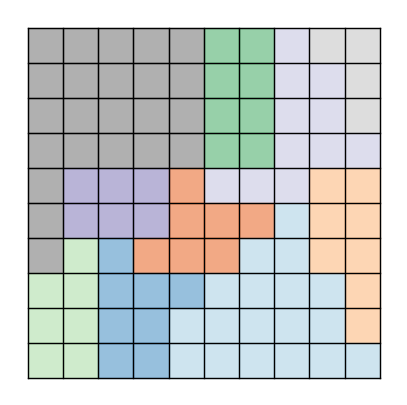

In [19]:
visualize_star_battle(puzzles[1])

In [11]:
print(classify_difficulty(puzzles[1], solutions[1]))

[[8 8 8 8 8 4 4 7 9 9]
 [8 8 8 8 8 4 4 7 7 9]
 [8 8 8 8 8 4 4 7 7 9]
 [8 8 8 8 8 4 4 7 7 7]
 [8 6 6 6 2 7 7 7 3 3]
 [8 6 6 6 2 2 2 1 3 3]
 [8 5 0 2 2 2 1 1 3 3]
 [5 5 0 0 0 1 1 1 1 3]
 [5 5 0 0 1 1 1 1 1 3]
 [5 5 0 0 1 1 1 1 1 1]]
Lshapes found
6 cell found
Extreme


In [ ]:
for i in range(len(puzzles)): 

    puzzle = puzzles[i]
    solution = solutions[i]

    print(classify_difficulty(puzzles[i], solutions[i]))

In [12]:
# Classify each puzzle
difficulty_labels = [classify_difficulty(puzzles[i], solutions[i]) for i in range(len(puzzles))]
print(difficulty_labels)
# Save labeled data
# np.savez_compressed("star_battle_labeled_dataset.npz", puzzles=puzzles, solutions=solutions, labels=np.array(difficulty_labels))
# print("Labeled dataset saved successfully!")

[[6 6 6 6 0 0 0 8 8 8]
 [6 6 6 6 0 0 0 8 8 8]
 [1 1 1 0 0 0 0 8 8 8]
 [9 9 9 0 0 0 0 8 8 8]
 [9 9 9 0 0 0 0 8 8 8]
 [9 9 9 0 0 4 4 4 8 8]
 [9 9 5 5 3 3 2 2 2 2]
 [5 5 5 5 3 3 3 2 2 7]
 [5 5 5 5 3 3 2 2 2 7]
 [5 5 5 5 3 3 7 7 7 7]]
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight lines applied
Straight l

In [17]:
search = "Extreme"
difficulty = np.array(difficulty_labels)
vale = np.where(difficulty == search)[0]
print(len(vale))

2497


[[1 1 1 1 1 9 9 9 9 9]
 [1 1 1 1 1 1 1 9 9 9]
 [1 1 1 1 1 1 1 8 8 8]
 [0 6 6 6 6 6 6 6 8 7]
 [0 0 0 0 6 4 6 7 7 7]
 [0 0 0 0 4 4 4 2 7 7]
 [0 0 3 3 4 4 2 2 2 2]
 [3 3 3 3 3 5 2 2 2 2]
 [3 3 3 3 3 5 5 5 5 5]
 [3 3 3 3 5 5 5 5 5 5]]


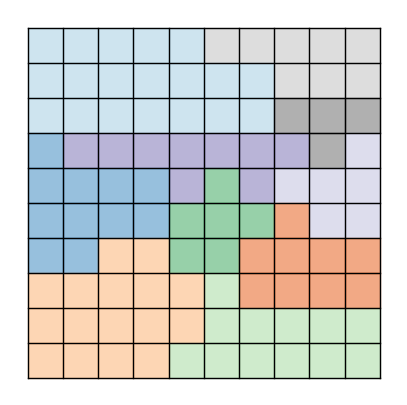

In [12]:
print(puzzles[373])
visualize_star_battle(puzzles[373])

In [35]:
print(classify_difficulty(puzzles[373], solutions[373]))

[[1 1 1 1 1 9 9 9 9 9]
 [1 1 1 1 1 1 1 9 9 9]
 [1 1 1 1 1 1 1 8 8 8]
 [0 6 6 6 6 6 6 6 8 7]
 [0 0 0 0 6 4 6 7 7 7]
 [0 0 0 0 4 4 4 2 7 7]
 [0 0 3 3 4 4 2 2 2 2]
 [3 3 3 3 3 5 2 2 2 2]
 [3 3 3 3 3 5 5 5 5 5]
 [3 3 3 3 5 5 5 5 5 5]]
tshapes found
pbqdshapes found
star surrounds zeroed
[[None None None None None None None 0 None None]
 [None None None None None None 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 1]
 [None None None None None None 0 0 0 0]
 [None None None None None None 0 1 0 None]
 [None None None None None None 0 0 0 None]
 [None None None None None None None 0 None None]
 [None None None None None None None 0 None None]
 [None None None None None None None 0 None None]
 [None None None None None None None 0 None None]]
Straight lines applied
pbqdshapes found
star surrounds zeroed
one cell starred
[[0 0 0 0 0 None None 0 None None]
 [None None None None None None 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 1]
 [None None None None 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 1 0 0]
 [None None None None 0 0 0 0 0 1]
 

In [ ]:
# dataset = np.load("star_battle_dataset.npz")
# puzzles = dataset["puzzles"]
# solutions = dataset["solutions"]

difficulties = []
for i in range(len(puzzles)):
    difficulty_score = classify_difficulty(puzzles[i], solutions[i])
    
    

# Save difficulty labels
print(difficulties)
# np.savez_compressed("star_battle_dataset_with_difficulty.npz", puzzles=puzzles, solutions=solutions, difficulties=difficulties)
# print("Dataset with difficulty scores saved!")
